## Libraries Used

In [1]:
from sklearn.decomposition import PCA
import numpy as np
import modin.pandas as pd
from pandas_profiling import ProfileReport
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from matplotlib import pyplot as plt

## Data Gathering

In [54]:
trueLabels = pd.read_csv('bbcsport/bbcsport.classes', header=None, index_col=[0], names = ['Category'])
trueLabels

,Category
0,0
1,0
2,0
3,0
4,0
...,...
732,4
733,4
734,4
735,4


In [55]:
terms = pd.read_csv('bbcsport/bbcsport.terms', header=None)
terms

,0
0,claxton
1,hunt
2,first
3,major
4,medal
...,...
4608,hip
4609,fiveset
4610,mario
4611,ancic


In [56]:
pd.set_option('display.max_columns', 4613)

X = pd.read_csv('C:\\Users\\Administrator\\Python Notebooks\\Coders Art\\Assesment\\Assesment\\Machine Learning\\Data\\bbcsport_mtx.csv', header = None)

In [57]:
X

0     1     2     3     4     5     6     7     8     9     10    11    \
0       7     1     3     2     4     2     1     1     2     2     1     3   
1       0     0     1     0     0     0     0     0     0     0     1     0   
2       0     0     0     0     1     0     0     0     0     2     0     0   
3       0     0     0     0     0     0     0     0     0     0     0     0   
4       0     0     0     0     0     0     0     0     0     2     0     0   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
732     0     0     4     0     0     1     0     0     0     0     0     0   
733     0     0     1     0     0     0     0     0     0     3     0     0   
734     0     0     2     0     0     0     0     0     0     1     1     0   
735     0     0     0     0     0     1     0     0     1     0     0     0   
736     0     0     4     0     0     0     0     0     0     2     0     0   

     12    13    14    15    16    17    18    19    20    21    22    23    \
0       2     1     1     2     1     1     2     3     1     2     1     1   
1       0     1     0     0     0     0     0     0     0     0     0     0   
2       1     1     0     0     0     1     1     0     0     1     2     1   
3       0     0     0     0     0     0     0     0     0     0     1     0   
4       2     0     0     0     0     3     0     0     0     0     2     1   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
732     0     1     0     0     0     0     0     0     0     0     1     0   
733     1     0     0     0     0     0     0     0     0     1     2     0   
734     1     0     0     0     0     0     0     0     0     1     1     0   
735     0     0     0     0     0     0     0     0     0     0     0     0   
736     0     0     0     0     0     0     0     0     0     0     6     0   

     24    25    26    27    28    29    30    31    32    33    34    35    \
0       1     1     1     2     1     2     1     1     2     1     2     1   
1       0     0     0     0     0     1     0     0     0     0     1     0   
2       0     3     0     4     0     0     6     3     0     0     1     1   
3       0     0     0     0     0     0     0     0     0     1     0     0   
4       0     2     0     0     0     0     1     0     1     0     0     0   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
732     0     4     0     0     0     0     0     0     1     0     0     0   
733     0     0     0     4     0     0     0     0     0     0     0     0   
734     0     0     0     1     0     1     0     0     0     0     0     0   
735     0     0     0     0     0     0     0     0     0     0     0     4   
736     0     4     0     1     0     0     0     0     0     0     0     0   

     36    37    38    39    40    41    42    43    44    45    46    47    \
0       1     1     1     1     2     1     1     1     1     1     1     1   
1       0     1     0     2     1     0     0     0     0     0     1     0   
2       0     0     0     0     0     0     0     0     0     0     0     0   
3       0     0     0     0     0     0     0     0     0     0     6     0   
4       0     0     0     0     1     0     0     0     0     1     0     0   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
732     0     0     0     0     0     0     0     0     0     0     0     0   
733     0     0     0     0     0     0     0     0     0     0     0     0   
734     0     0     0     0     0     0     0     0     0     0     0     0   
735     0     0     0     0     0     0     0     0     0     0     0     0   
736     0     0     0     0     1     0     0     0     0     0     0     0   

     48    49    50    51    52    53    54    55    56    57    58    59    \
0       1     2     1     1     1     1     1     1     1     1     1     1   
1       0     0     2     1     0     0     0     0

In [58]:
data = pd.concat([X, trueLabels], axis = 1)
data

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  \
0    7  1  3  2  4  2  1  1  2  2   1   3   2   1   1   2   1   1   2   3   1   
1    0  0  1  0  0  0  0  0  0  0   1   0   0   1   0   0   0   0   0   0   0   
2    0  0  0  0  1  0  0  0  0  2   0   0   1   1   0   0   0   1   1   0   0   
3    0  0  0  0  0  0  0  0  0  0   0   0   0   0   0   0   0   0   0   0   0   
4    0  0  0  0  0  0  0  0  0  2   0   0   2   0   0   0   0   3   0   0   0   
..  .. .. .. .. .. .. .. .. .. ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..   
732  0  0  4  0  0  1  0  0  0  0   0   0   0   1   0   0   0   0   0   0   0   
733  0  0  1  0  0  0  0  0  0  3   0   0   1   0   0   0   0   0   0   0   0   
734  0  0  2  0  0  0  0  0  0  1   1   0   1   0   0   0   0   0   0   0   0   
735  0  0  0  0  0  1  0  0  1  0   0   0   0   0   0   0   0   0   0   0   0   
736  0  0  4  0  0  0  0  0  0  2   0   0   0   0   0   0   0   0   0   0   0   

     21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  \
0     2   1   1   1   1   1   2   1   2   1   1   2   1   2   1   1   1   1   
1     0   0   0   0   0   0   0   0   1   0   0   0   0   1   0   0   1   0   
2     1   2   1   0   3   0   4   0   0   6   3   0   0   1   1   0   0   0   
3     0   1   0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   
4     0   2   1   0   2   0   0   0   0   1   0   1   0   0   0   0   0   0   
..   ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..   
732   0   1   0   0   4   0   0   0   0   0   0   1   0   0   0   0   0   0   
733   1   2   0   0   0   0   4   0   0   0   0   0   0   0   0   0   0   0   
734   1   1   0   0   0   0   1   0   1   0   0   0   0   0   0   0   0   0   
735   0   0   0   0   0   0   0   0   0   0   0   0   0   0   4   0   0   0   
736   0   6   0   0   4   0   1   0   0   0   0   0   0   0   0   0   0   0   

     39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  \
0     1   2   1   1   1   1   1   1   1   1   2   1   1   1   1   1   1   1   
1     2   1   0   0   0   0   0   1   0   0   0   2   1   0   0   0   0   0   
2     0   0   0   0   0   0   0   0   0   0   2   6   0   1   1   1   0   0   
3     0   0   0   0   0   0   0   6   0   0   0   1   0   0   0   0   0   0   
4     0   1   0   0   0   0   1   0   0   0   0   3   0   0   0   0   0   0   
..   ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..   
732   0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   0   0   
733   0   0   0   0   0   0   0   0   0   0   0   1   2   0   0   0   0   0   
734   0   0   0   0   0   0   0   0   0   0   1   2   0   0   0   0   0   0   
735   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
736   0   1   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

     57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  \
0     1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   
1     0   0   0   0   0   0   1   0   0   0   1   0   0   0   0   0   1   0   
2     0   0   0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   
3     0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
4     0   0   0   0   0   0   0   0   0   0   0   1   0   1   0   0   0   0   
..   ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..   
732   0   0   0   0   0   0   0   0   0   0   0   0   0   0   1   0   0   0   
733   0   0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0   0   
734   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
735   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
736   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

     75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  \
0     1   1   1   1   1   1   0   0   0   0   0   0   0   0   0   0   0   0   
1     0   0   0   0   0   1

## With Standard Scaling

### Dimensions for 95 % Variance

In [35]:
p_95 = PCA(n_components = 0.95)

In [36]:
p_95

PCA(copy=True, iterated_power='auto', n_components=0.95, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [37]:
x = StandardScaler().fit_transform(data.iloc[:,:-1])
# what StandardScaler().fit_transform do is  ((x-mean)/std_dev)


In [38]:
x = pd.DataFrame(x)
x

0         1         2         3         4         5         6  \
0    24.942248  8.528795  1.514279  4.710037  8.073521  3.602565  9.549235   
1    -0.067870 -0.093594  0.028229 -0.299050 -0.193495 -0.253775 -0.078379   
2    -0.067870 -0.093594 -0.714796 -0.299050  1.873259 -0.253775 -0.078379   
3    -0.067870 -0.093594 -0.714796 -0.299050 -0.193495 -0.253775 -0.078379   
4    -0.067870 -0.093594 -0.714796 -0.299050 -0.193495 -0.253775 -0.078379   
..         ...       ...       ...       ...       ...       ...       ...   
732  -0.067870 -0.093594  2.257304 -0.299050 -0.193495  1.674395 -0.078379   
733  -0.067870 -0.093594  0.028229 -0.299050 -0.193495 -0.253775 -0.078379   
734  -0.067870 -0.093594  0.771254 -0.299050 -0.193495 -0.253775 -0.078379   
735  -0.067870 -0.093594 -0.714796 -0.299050 -0.193495  1.674395 -0.078379   
736  -0.067870 -0.093594  2.257304 -0.299050 -0.193495 -0.253775 -0.078379   

            7         8         9        10        11        12        13  \
0    7.477060  3.628404  0.619517  1.408476  3.548979  2.500237  1.136285   
1   -0.071698 -0.380792 -0.659430  1.408476 -0.265699 -0.217572  1.136285   
2   -0.071698 -0.380792  0.619517 -0.445179 -0.265699  1.141332  1.136285   
3   -0.071698 -0.380792 -0.659430 -0.445179 -0.265699 -0.217572 -0.367202   
4   -0.071698 -0.380792  0.619517 -0.445179 -0.265699  2.500237 -0.367202   
..        ...       ...       ...       ...       ...       ...       ...   
732 -0.071698 -0.380792 -0.659430 -0.445179 -0.265699 -0.217572  1.136285   
733 -0.071698 -0.380792  1.258990 -0.445179 -0.265699  1.141332 -0.367202   
734 -0.071698 -0.380792 -0.019956  1.408476 -0.265699  1.141332 -0.367202   
735 -0.071698  1.623806 -0.659430 -0.445179 -0.265699 -0.217572 -0.367202   
736 -0.071698 -0.380792  0.619517 -0.445179 -0.265699 -0.217572 -0.367202   

           14         15        16        17        18         19       20  \
0    1.408988  11.550464  5.574440  1.094256  4.538861  11.852809  3.04772   
1   -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
2   -0.252491  -0.142794 -0.147513  1.094256  2.191394  -0.135554 -0.25062   
3   -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
4   -0.252491  -0.142794 -0.147513  3.889635 -0.156073  -0.135554 -0.25062   
..        ...        ...       ...       ...       ...        ...      ...   
732 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
733 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
734 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
735 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
736 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   

           21        22        23         24        25        26        27  \
0    1.651707  0.475101  1.052641  13.536986  0.337709  3.286479  2.022618   
1   -0.459842 -0.402467 -0.342676  -0.073872 -0.523507 -0.096391 -0.321202   
2    0.595932  1.352669  1.052641  -0.073872  2.060139 -0.096391  4.366438   
3   -0.459842  0.475101 -0.342676  -0.073872 -0.523507 -0.096391 -0.321202   
4   -0.459842  1.352669  1.052641  -0.073872  1.198924 -0.096391 -0.321202   
..        ...       ...       ...        ...       ...       ...       ...   
732 -0.459842  0.475101 -0.342676  -0.073872  2.921354 -0.096391 -0.321202   
733  0.595932  1.352669 -0.342676  -0.073872 -0.523507 -0.096391  4.366438   
734  0.595932  0.475101 -0.342676  -0.073872 -0.523507 -0.096391  0.850708   
735 -0.459842 -0.402467 -0.342676  -0.073872 -0.523507 -0.096391 -0.321202   
736 -0.459842  4.862939 -0.342676  -0.073872  2.921354 -0.096391  0.850708   

           28        29        30        31        32        33        34  \
0    2.758130  2.085076  0.901049  1.738305  3.906656  1.605276  3.209144   
1   -0.289459  0.758046 -0.282682 -0.379267 -0.390666 -0.293742  1.458486   
2   -0.289459 -0.568984  6.819707  5.973447 -0

In [39]:
x = p_95.fit_transform(x) 
x = pd.DataFrame(x)

In [40]:
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553
0,-3.094348,-1.408669,-1.074060,2.387182,0.157626,-1.733649,3.794264,-0.851546,-5.840739,-2.100306,-6.493179,-0.068705,-4.118188,-2.655025,-0.582100,-1.572577,0.084375,0.709234,-0.114782,3.032384,0.475938,-0.715803,2.660983,0.131338,-0.197562,0.442066,-0.428855,1.656568,-2.523814,-0.655614,-1.898937,0.790891,0.335323,1.596184,-1.027530,-0.127881,0.063088,-0.703435,-2.170135,-0.091698,-1.080932,-1.688238,0.591666,-1.341281,-0.718343,-0.214535,0.153848,0.840484,-0.495092,0.170973,-1.231927,0.243012,-0.166488,-0.745180,-0.782988,1.786249,0.189664,-0.370816,1.007021,-2.072226,0.884813,-1.841642,3.359240,0.781866,0.012140,-1.184589,-3.065285,-0.006114,1.587935,-0.998796,0.217326,-0.338637,-1.614809,2.470243,-0.089693,2.058335,-1.763873,-1.336181,1.128806,-1.165960,2.858513,2.325157,-0.500324,-0.026880,-0.476449,1.641371,-3.427801,2.239055,1.252071,2.377519,-0.133293,0.153161,-0.880626,0.243292,1.200850,0.536775,1.256294,1.792682,2.389327,-1.435640,0.402287,-0.635867,-1.422324,-0.733485,-0.154173,1.080588,-0.522688,-1.014304,-0.889443,-0.901711,0.867784,0.147271,-1.768304,-1.065349,0.893033,-1.142345,0.721887,-1.273453,-0.647469,-1.032241,-2.213995,-0.791435,-1.233595,0.276486,2.179676,0.717705,-0.687115,-1.828624,-0.273774,1.346447,0.541094,0.533937,-1.936178,-0.363913,0.711145,1.211604,-0.379873,0.093823,0.990258,2.427993,5.271120,-1.542832,-1.197101,-0.673428,-0.044083,-0.852537,-0.671934,-0.761718,2.240061,0.833227,-0.804217,-0.768426,-0.411883,-2.178032,0.803110,-1.723182,-0.786437,0.024914,2.856373,-1.162654,-0.224479,0.174767,0.621360,0.430472,0.622116,1.663345,-0.201512,-1.668112,2.227695,-1.401687,-1.293799,0.295124,3.662375,0.900700,0.224886,-0.038559,1.895695,-1.942917,-0.660560,0.101807,2.273098,-0.574848,2.498317,-0.037539,3.055442,0.470817,1.416745,0.716728,-1.318953,-1.376656,2.531572,1.582056,0.934240,1.587641,-2.833252,-1.443667,0.256361,-0.292945,0.

In [41]:
p_95.explained_variance_ratio_

array([0.01508903, 0.01288485, 0.01163065, 0.01009048, 0.00956752,
       0.00872553, 0.00852878, 0.00818104, 0.00768506, 0.00725114,
       0.00716023, 0.00649157, 0.00642774, 0.00632654, 0.00615031,
       0.00570733, 0.0056436 , 0.00550992, 0.00546076, 0.00536609,
       0.00523771, 0.00487331, 0.00484098, 0.00473873, 0.00458494,
       0.00452491, 0.00443956, 0.00437282, 0.00431263, 0.00425796,
       0.00423527, 0.00405756, 0.00399891, 0.00398526, 0.00393518,
       0.00390003, 0.00385345, 0.00382306, 0.00378409, 0.00376098,
       0.00367593, 0.00364109, 0.00361984, 0.0036002 , 0.00353945,
       0.0034998 , 0.0034441 , 0.00343224, 0.00339606, 0.00338237,
       0.00337093, 0.00334168, 0.00329034, 0.00328949, 0.00327135,
       0.00324153, 0.00321682, 0.00318894, 0.00314741, 0.00313415,
       0.00311474, 0.0030949 , 0.00307719, 0.00305038, 0.00303873,
       0.00302849, 0.00299945, 0.00297445, 0.00297108, 0.00295434,
       0.00292189, 0.0029157 , 0.00289645, 0.00287011, 0.00285

Text(0, 0.5, 'Cumulative Variance Retained')

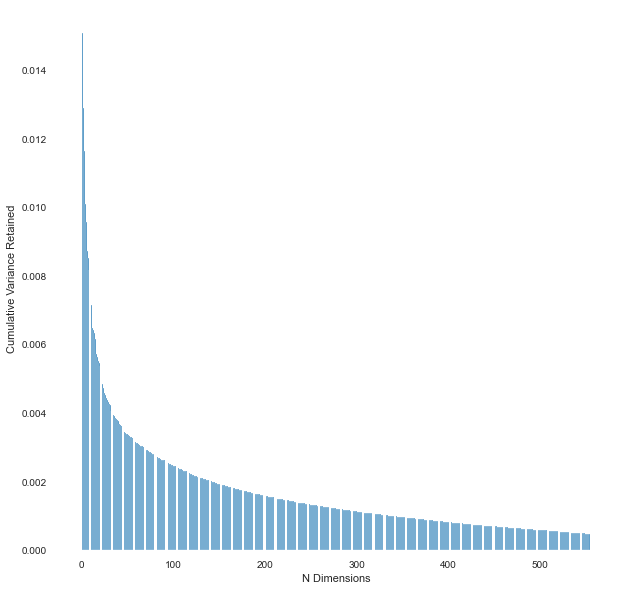

In [42]:
plt.figure(figsize = (10,10))
plt.bar(range(1,555), p_95.explained_variance_ratio_) #p.explained_variance_ratio_ tell the importance of a feature
plt.xlabel('N Dimensions')
plt.ylabel('Cumulative Variance Retained')

In [43]:
print('No. of Dimensions corresponding to 95% variance = {}'.format(len(p_95.explained_variance_ratio_)))

No. of Dimensions corresponding to 95% variance = 554


### Dimensions for 98 % Variance

In [44]:
p_98 = PCA(n_components = 0.98)


In [45]:
p_98

PCA(copy=True, iterated_power='auto', n_components=0.98, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [46]:
x = StandardScaler().fit_transform(data.iloc[:,:-1])

In [47]:
x = pd.DataFrame(x)
x

0         1         2         3         4         5         6  \
0    24.942248  8.528795  1.514279  4.710037  8.073521  3.602565  9.549235   
1    -0.067870 -0.093594  0.028229 -0.299050 -0.193495 -0.253775 -0.078379   
2    -0.067870 -0.093594 -0.714796 -0.299050  1.873259 -0.253775 -0.078379   
3    -0.067870 -0.093594 -0.714796 -0.299050 -0.193495 -0.253775 -0.078379   
4    -0.067870 -0.093594 -0.714796 -0.299050 -0.193495 -0.253775 -0.078379   
..         ...       ...       ...       ...       ...       ...       ...   
732  -0.067870 -0.093594  2.257304 -0.299050 -0.193495  1.674395 -0.078379   
733  -0.067870 -0.093594  0.028229 -0.299050 -0.193495 -0.253775 -0.078379   
734  -0.067870 -0.093594  0.771254 -0.299050 -0.193495 -0.253775 -0.078379   
735  -0.067870 -0.093594 -0.714796 -0.299050 -0.193495  1.674395 -0.078379   
736  -0.067870 -0.093594  2.257304 -0.299050 -0.193495 -0.253775 -0.078379   

            7         8         9        10        11        12        13  \
0    7.477060  3.628404  0.619517  1.408476  3.548979  2.500237  1.136285   
1   -0.071698 -0.380792 -0.659430  1.408476 -0.265699 -0.217572  1.136285   
2   -0.071698 -0.380792  0.619517 -0.445179 -0.265699  1.141332  1.136285   
3   -0.071698 -0.380792 -0.659430 -0.445179 -0.265699 -0.217572 -0.367202   
4   -0.071698 -0.380792  0.619517 -0.445179 -0.265699  2.500237 -0.367202   
..        ...       ...       ...       ...       ...       ...       ...   
732 -0.071698 -0.380792 -0.659430 -0.445179 -0.265699 -0.217572  1.136285   
733 -0.071698 -0.380792  1.258990 -0.445179 -0.265699  1.141332 -0.367202   
734 -0.071698 -0.380792 -0.019956  1.408476 -0.265699  1.141332 -0.367202   
735 -0.071698  1.623806 -0.659430 -0.445179 -0.265699 -0.217572 -0.367202   
736 -0.071698 -0.380792  0.619517 -0.445179 -0.265699 -0.217572 -0.367202   

           14         15        16        17        18         19       20  \
0    1.408988  11.550464  5.574440  1.094256  4.538861  11.852809  3.04772   
1   -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
2   -0.252491  -0.142794 -0.147513  1.094256  2.191394  -0.135554 -0.25062   
3   -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
4   -0.252491  -0.142794 -0.147513  3.889635 -0.156073  -0.135554 -0.25062   
..        ...        ...       ...       ...       ...        ...      ...   
732 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
733 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
734 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
735 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   
736 -0.252491  -0.142794 -0.147513 -0.303433 -0.156073  -0.135554 -0.25062   

           21        22        23         24        25        26        27  \
0    1.651707  0.475101  1.052641  13.536986  0.337709  3.286479  2.022618   
1   -0.459842 -0.402467 -0.342676  -0.073872 -0.523507 -0.096391 -0.321202   
2    0.595932  1.352669  1.052641  -0.073872  2.060139 -0.096391  4.366438   
3   -0.459842  0.475101 -0.342676  -0.073872 -0.523507 -0.096391 -0.321202   
4   -0.459842  1.352669  1.052641  -0.073872  1.198924 -0.096391 -0.321202   
..        ...       ...       ...        ...       ...       ...       ...   
732 -0.459842  0.475101 -0.342676  -0.073872  2.921354 -0.096391 -0.321202   
733  0.595932  1.352669 -0.342676  -0.073872 -0.523507 -0.096391  4.366438   
734  0.595932  0.475101 -0.342676  -0.073872 -0.523507 -0.096391  0.850708   
735 -0.459842 -0.402467 -0.342676  -0.073872 -0.523507 -0.096391 -0.321202   
736 -0.459842  4.862939 -0.342676  -0.073872  2.921354 -0.096391  0.850708   

           28        29        30        31        32        33        34  \
0    2.758130  2.085076  0.901049  1.738305  3.906656  1.605276  3.209144   
1   -0.289459  0.758046 -0.282682 -0.379267 -0.390666 -0.293742  1.458486   
2   -0.289459 -0.568984  6.819707  5.973447 -0

In [48]:
x = p_98.fit_transform(x) 
x = pd.DataFrame(x)

In [49]:
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626
0,-3.094348,-1.408669,-1.074060,2.387182,0.157626,-1.733649,3.794264,-0.851546,-5.840739,-2.100306,-6.493179,-0.068705,-4.118188,-2.655025,-0.582100,-1.572577,0.084375,0.709234,-0.114782,3.032384,0.475938,-0.715803,2.660983,0.131338,-0.197562,0.442066,-0.428855,1.656568,-2.523814,-0.655614,-1.898937,0.790891,0.335323,1.596184,-1.027530,-0.127881,0.063088,-0.703435,-2.170135,-0.091698,-1.080932,-1.688238,0.591666,-1.341281,-0.718343,-0.214535,0.153848,0.840484,-0.495092,0.170973,-1.231927,0.243012,-0.166488,-0.745180,-0.782988,1.786249,0.189664,-0.370816,1.007021,-2.072226,0.884813,-1.841642,3.359240,0.781866,0.012140,-1.184589,-3.065285,-0.006114,1.587935,-0.998796,0.217326,-0.338637,-1.614809,2.470243,-0.089693,2.058335,-1.763873,-1.336181,1.128806,-1.165960,2.858513,2.325157,-0.500324,-0.026880,-0.476449,1.641371,-3.427801,2.239055,1.252071,2.377519,-0.133293,0.153161,-0.880626,0.243292,1.200850,0.536775,1.256294,1.792682,2.389327,-1.435640,0.402287,-0.635867,-1.422324,-0.733485,-0.154173,1.080588,-0.522688,-1.014304,-0.889443,-0.901711,0.867784,0.147271,-1.768304,-1.065349,0.893033,-1.142345,0.721887,-1.273453,-0.647469,-1.032241,-2.213995,-0.791435,-1.233595,0.276486,2.179676,0.717705,-0.687115,-1.828624,-0.273774,1.346447,0.541094,0.533937,-1.936178,-0.363913,0.711145,1.211604,-0.379873,0.093823,0.990258,2.427993,5.271120,-1.542832,-1.197101,-0.673428,-0.044083,-0.852537,-0.671934,-0.761718,2.240061,0.833227,-0.804217,-0.768426,-0.411883,-2.178032,0.803110,-1.723182,-0.786437,0.024914,2.856373,-1.162654,-0.224479,0.174767,0.621360,0.430472,0.622116,1.663345,-0.201512,-1

In [50]:
p_98.explained_variance_ratio_

array([0.01508903, 0.01288485, 0.01163065, 0.01009048, 0.00956752,
       0.00872553, 0.00852878, 0.00818104, 0.00768506, 0.00725114,
       0.00716023, 0.00649157, 0.00642774, 0.00632654, 0.00615031,
       0.00570733, 0.0056436 , 0.00550992, 0.00546076, 0.00536609,
       0.00523771, 0.00487331, 0.00484098, 0.00473873, 0.00458494,
       0.00452491, 0.00443956, 0.00437282, 0.00431263, 0.00425796,
       0.00423527, 0.00405756, 0.00399891, 0.00398526, 0.00393518,
       0.00390003, 0.00385345, 0.00382306, 0.00378409, 0.00376098,
       0.00367593, 0.00364109, 0.00361984, 0.0036002 , 0.00353945,
       0.0034998 , 0.0034441 , 0.00343224, 0.00339606, 0.00338237,
       0.00337093, 0.00334168, 0.00329034, 0.00328949, 0.00327135,
       0.00324153, 0.00321682, 0.00318894, 0.00314741, 0.00313415,
       0.00311474, 0.0030949 , 0.00307719, 0.00305038, 0.00303873,
       0.00302849, 0.00299945, 0.00297445, 0.00297108, 0.00295434,
       0.00292189, 0.0029157 , 0.00289645, 0.00287011, 0.00285

Text(0, 0.5, 'Cumulative Variance Retained')

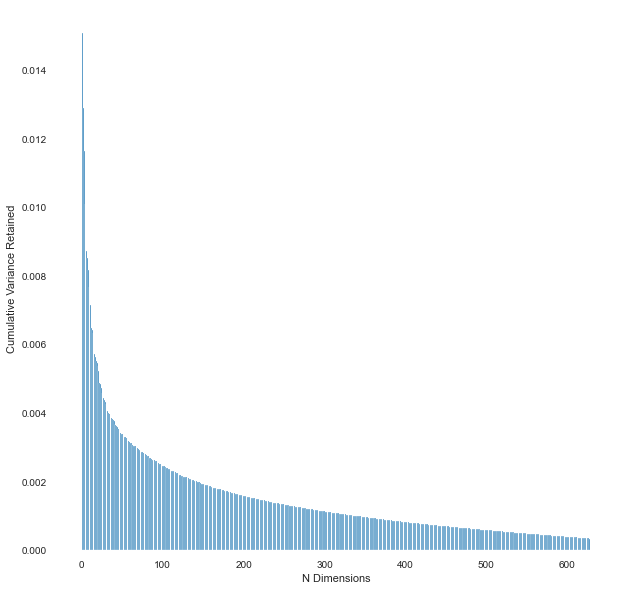

In [51]:
plt.figure(figsize = (10,10))
plt.bar(range(1,628), p_98.explained_variance_ratio_) #p.explained_variance_ratio_ tell the importance of a feature
plt.xlabel('N Dimensions')
plt.ylabel('Cumulative Variance Retained')

In [52]:
print('No. of Dimensions corresponding to 98% variance = {}'.format(len(p_98.explained_variance_ratio_)))

No. of Dimensions corresponding to 98% variance = 627


## Without Standard Scaler

### Dimensions for 95 % Variance

In [59]:
p_95 = PCA(n_components = 0.95)

In [60]:
p_95

PCA(copy=True, iterated_power='auto', n_components=0.95, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [61]:
x = p_95.fit_transform(x) 
x = pd.DataFrame(x)

In [62]:
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517
0,-3.094348,-1.408669,-1.074060,2.387182,0.157626,-1.733649,3.794264,-0.851546,-5.840739,-2.100306,-6.493179,-0.068705,-4.118188,-2.655025,-0.582100,-1.572577,0.084375,0.709234,-0.114782,3.032384,0.475938,-0.715803,2.660983,0.131338,-0.197562,0.442066,-0.428855,1.656568,-2.523814,-0.655614,-1.898937,0.790891,0.335323,1.596184,-1.027530,-0.127881,0.063088,-0.703435,-2.170135,-0.091698,-1.080932,-1.688238,0.591666,-1.341281,-0.718343,-0.214535,0.153848,0.840484,-0.495092,0.170973,-1.231927,0.243012,-0.166488,-0.745180,-0.782988,1.786249,0.189664,-0.370816,1.007021,-2.072226,0.884813,-1.841642,3.359240,0.781866,0.012140,-1.184589,-3.065285,-0.006114,1.587935,-0.998796,0.217326,-0.338637,-1.614809,2.470243,-0.089693,2.058335,-1.763873,-1.336181,1.128806,-1.165960,2.858513,2.325157,-0.500324,-0.026880,-0.476449,1.641371,-3.427801,2.239055,1.252071,2.377519,-0.133293,0.153161,-0.880626,0.243292,1.200850,0.536775,1.256294,1.792682,2.389327,-1.435640,0.402287,-0.635867,-1.422324,-0.733485,-0.154173,1.080588,-0.522688,-1.014304,-0.889443,-0.901711,0.867784,0.147271,-1.768304,-1.065349,0.893033,-1.142345,0.721887,-1.273453,-0.647469,-1.032241,-2.213995,-0.791435,-1.233595,0.276486,2.179676,0.717705,-0.687115,-1.828624,-0.273774,1.346447,0.541094,0.533937,-1.936178,-0.363913,0.711145,1.211604,-0.379873,0.093823,0.990258,2.427993,5.271120,-1.542832,-1.197101,-0.673428,-0.044083,-0.852537,-0.671934,-0.761718,2.240061,0.833227,-0.804217,-0.768426,-0.411883,-2.178032,0.803110,-1.723182,-0.786437,0.024914,2.856373,-1.162654,-0.224479,0.174767,0.621360,0.430472,0.622116,1.663345,-0.201512,-1.668112,2.227695,-1.401687,-1.293799,0.295124,3.662375,0.900700,0.224886,-0.038559,1.895695,-1.942917,-0.660560,0.101807,2.273098,-0.574848,2.498317,-0.037539,3.055442,0.470817,1.416745,0.716728,-1.318953,-1.376656,2.531572,1.582056,0.934240,1.587641,-2.833252,-1.443667,0.256361,-0.292945,0.733147,1.131721,0.951628,-2.557288,-0.308255,0.140417,-0.365247,1.115892,-0.304745,-0.004440,-1.170836,1.218579,-1.061204,0.404732,-0.269575,-0.

In [63]:
p_95.explained_variance_ratio_

array([0.01539179, 0.0131434 , 0.01186403, 0.01029295, 0.00975949,
       0.00890061, 0.00869992, 0.00834519, 0.00783926, 0.00739664,
       0.00730391, 0.00662183, 0.00655671, 0.00645349, 0.00627372,
       0.00582185, 0.00575684, 0.00562048, 0.00557034, 0.00547377,
       0.00534281, 0.00497109, 0.00493812, 0.00483381, 0.00467694,
       0.00461571, 0.00452865, 0.00446056, 0.00439917, 0.0043434 ,
       0.00432025, 0.00413898, 0.00407915, 0.00406523, 0.00401414,
       0.00397828, 0.00393077, 0.00389977, 0.00386002, 0.00383644,
       0.00374969, 0.00371415, 0.00369248, 0.00367244, 0.00361047,
       0.00357003, 0.00351321, 0.00350111, 0.00346421, 0.00345024,
       0.00343857, 0.00340873, 0.00335637, 0.0033555 , 0.00333699,
       0.00330657, 0.00328137, 0.00325293, 0.00321057, 0.00319703,
       0.00317724, 0.003157  , 0.00313894, 0.00311159, 0.0030997 ,
       0.00308926, 0.00305964, 0.00303413, 0.0030307 , 0.00301362,
       0.00298052, 0.0029742 , 0.00295457, 0.0029277 , 0.00291

Text(0, 0.5, 'Cumulative Variance Retained')

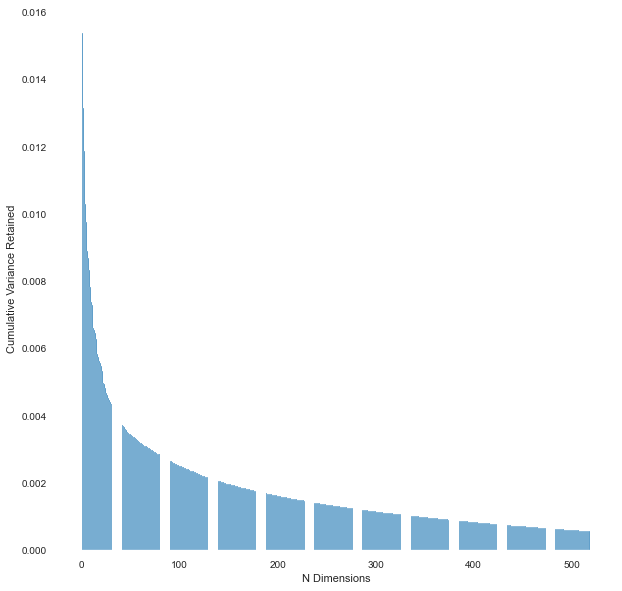

In [66]:
plt.figure(figsize = (10,10))
plt.bar(range(1,519), p_95.explained_variance_ratio_) #p.explained_variance_ratio_ tell the importance of a feature
plt.xlabel('N Dimensions')
plt.ylabel('Cumulative Variance Retained')

In [67]:
print('No. of Dimensions corresponding to 95% variance = {}'.format(len(p_95.explained_variance_ratio_)))

No. of Dimensions corresponding to 95% variance = 518


### Dimensions for 98 % Variance

In [68]:
p_98 = PCA(n_components = 0.98)


In [69]:
p_98

PCA(copy=True, iterated_power='auto', n_components=0.98, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [70]:
x = p_98.fit_transform(x) 
x = pd.DataFrame(x)

In [71]:
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486
0,-3.094348,-1.408669,-1.074060,2.387182,0.157626,-1.733649,3.794264,-0.851546,-5.840739,-2.100306,-6.493179,-0.068705,-4.118188,-2.655025,-0.582100,-1.572577,0.084375,0.709234,-0.114782,3.032384,0.475938,-0.715803,2.660983,0.131338,-0.197562,0.442066,-0.428855,1.656568,-2.523814,-0.655614,-1.898937,0.790891,0.335323,1.596184,-1.027530,-0.127881,0.063088,-0.703435,-2.170135,-0.091698,-1.080932,-1.688238,0.591666,-1.341281,-0.718343,-0.214535,0.153848,0.840484,-0.495092,0.170973,-1.231927,0.243012,-0.166488,-0.745180,-0.782988,1.786249,0.189664,-0.370816,1.007021,-2.072226,0.884813,-1.841642,3.359240,0.781866,0.012140,-1.184589,-3.065285,-0.006114,1.587935,-0.998796,0.217326,-0.338637,-1.614809,2.470243,-0.089693,2.058335,-1.763873,-1.336181,1.128806,-1.165960,2.858513,2.325157,-0.500324,-0.026880,-0.476449,1.641371,-3.427801,2.239055,1.252071,2.377519,-0.133293,0.153161,-0.880626,0.243292,1.200850,0.536775,1.256294,1.792682,2.389327,-1.435640,0.402287,-0.635867,-1.422324,-0.733485,-0.154173,1.080588,-0.522688,-1.014304,-0.889443,-0.901711,0.867784,0.147271,-1.768304,-1.065349,0.893033,-1.142345,0.721887,-1.273453,-0.647469,-1.032241,-2.213995,-0.791435,-1.233595,0.276486,2.179676,0.717705,-0.687115,-1.828624,-0.273774,1.346447,0.541094,0.533937,-1.936178,-0.363913,0.711145,1.211604,-0.379873,0.093823,0.990258,2.427993,5.271120,-1.542832,-1.197101,-0.673428,-0.044083,-0.852537,-0.671934,-0.761718,2.240061,0.833227,-0.804217,-0.768426,-0.411883,-2.178032,0.803110,-1.723182,-0.786437,0.024914,2.856373,-1.162654,-0.224479,0.174767,0.621360,0.430472,0.622116,1.663345,-0.201512,-1.668112,2.227695,-1.401687,-1.293799,0.295124,3.662375,0.900700,0.224886,-0.038559,1.895695,-1.942917,-0.660560,0.101807,2.273098,-0.574848,2.498317,-0.037539,3.055442,0.470817,1.416745,0.716728,-1.318953,-1.376656,2.531572,1.582056,0.934240,1.587641,-2.833252,-1.443667,0.256361,-0.292945,0.733147,1.131721,0.951628,-2.557288,-0.308255,0.140417,-0.365247,1.115892,-0.304745,-0.004440,-1.170836,1.218579,-1.061204,0.404732,-0.269575,-0.173596,0.536192,-0.498270,0.048409,-1.893601,0.615506,-1.079339,1.194417,-1.104382,1.342207,-3.369049,-0.658239,-3.335732,0.

In [50]:
p_98.explained_variance_ratio_

array([0.01508903, 0.01288485, 0.01163065, 0.01009048, 0.00956752,
       0.00872553, 0.00852878, 0.00818104, 0.00768506, 0.00725114,
       0.00716023, 0.00649157, 0.00642774, 0.00632654, 0.00615031,
       0.00570733, 0.0056436 , 0.00550992, 0.00546076, 0.00536609,
       0.00523771, 0.00487331, 0.00484098, 0.00473873, 0.00458494,
       0.00452491, 0.00443956, 0.00437282, 0.00431263, 0.00425796,
       0.00423527, 0.00405756, 0.00399891, 0.00398526, 0.00393518,
       0.00390003, 0.00385345, 0.00382306, 0.00378409, 0.00376098,
       0.00367593, 0.00364109, 0.00361984, 0.0036002 , 0.00353945,
       0.0034998 , 0.0034441 , 0.00343224, 0.00339606, 0.00338237,
       0.00337093, 0.00334168, 0.00329034, 0.00328949, 0.00327135,
       0.00324153, 0.00321682, 0.00318894, 0.00314741, 0.00313415,
       0.00311474, 0.0030949 , 0.00307719, 0.00305038, 0.00303873,
       0.00302849, 0.00299945, 0.00297445, 0.00297108, 0.00295434,
       0.00292189, 0.0029157 , 0.00289645, 0.00287011, 0.00285

Text(0, 0.5, 'Cumulative Variance Retained')

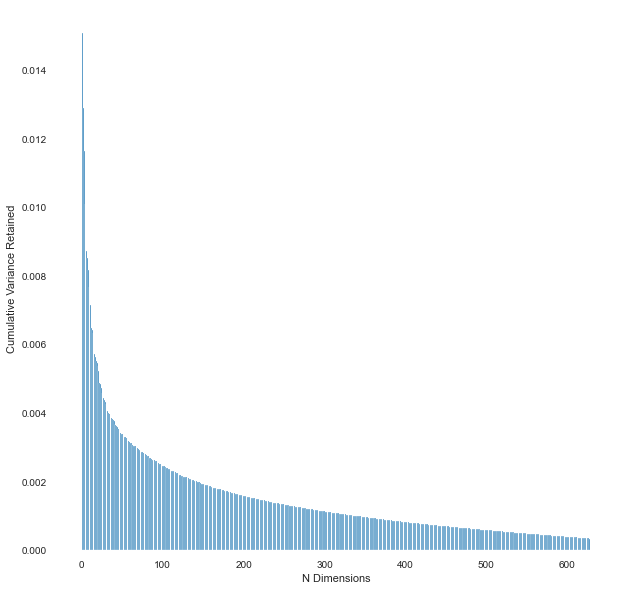

In [51]:
plt.figure(figsize = (10,10))
plt.bar(range(1,628), p_98.explained_variance_ratio_) #p.explained_variance_ratio_ tell the importance of a feature
plt.xlabel('N Dimensions')
plt.ylabel('Cumulative Variance Retained')

In [52]:
print('No. of Dimensions corresponding to 98% variance = {}'.format(len(p_98.explained_variance_ratio_)))

No. of Dimensions corresponding to 98% variance = 627
